#🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competetion.'
https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means that there are 120 different classes).
* There are around 10,000_ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll have to predict them).


In [ ]:
# !unzip "drive/MyDrive/dog vision/dog-breed-identification.zip" -d "drive/My Drive/dog vision/"

### Get our workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)
print("GPU", "available(YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not  available")

TF Hub version: 0.16.1
GPU not  available


## Getting our data ready (turning into Tensors)

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


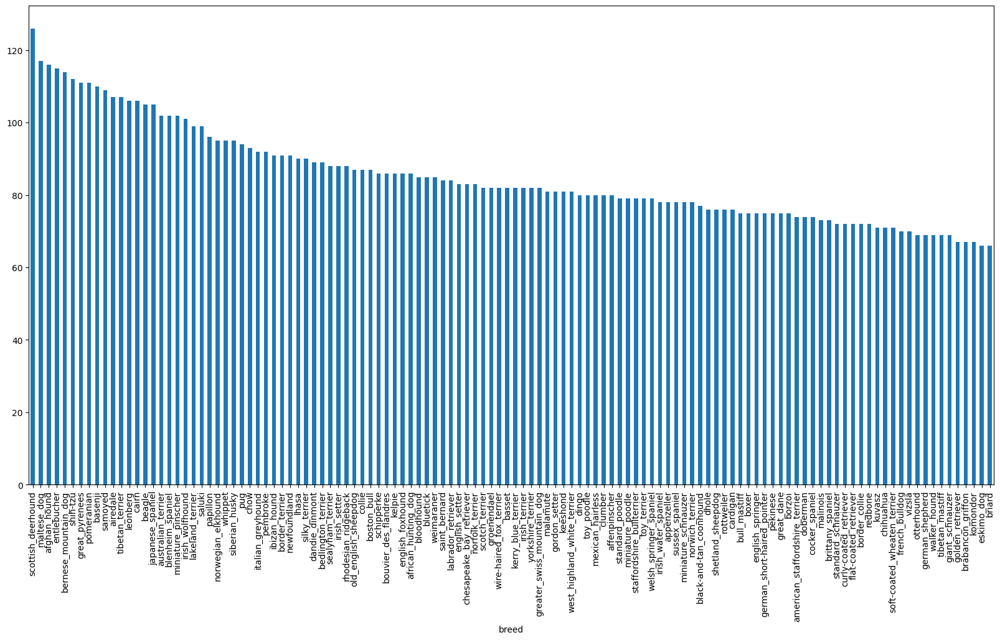

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

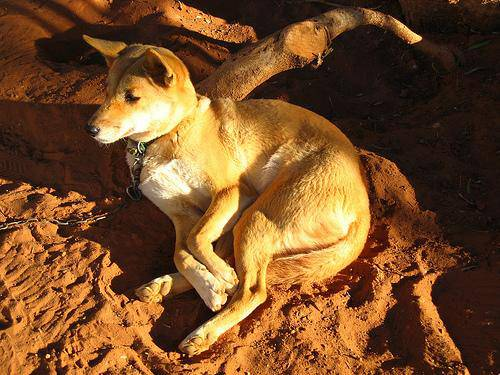

In [ ]:
from IPython.display import Image
Image("drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/My Drive/dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("drive/My Drive/dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed")
else:
  print("Filenames do match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed


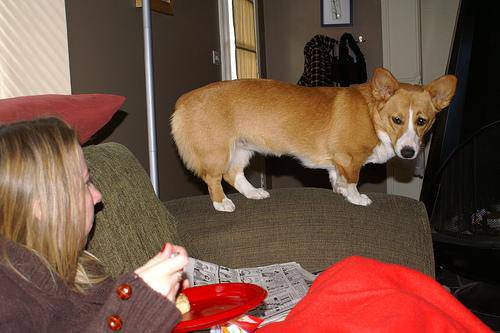

In [ ]:
Image(filenames[10000])

In [ ]:
labels_csv["breed"][10000]

'pembroke'

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("True")
else:
  print("False")

True


In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
x = filenames
y = boolean_labels

In [ ]:
print(len(filenames))
print(len(boolean_labels))

10222
10222


In [ ]:
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:5], y_train[:2]

(['drive/My Drive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into tensors)

1. Take an imahe filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn `image` into tensors
4. Normalize our image(convert colour channels from 0-255 to 0-1)
5. Resize `image` to ne of shape(244, 244)
6. Return the modified `image`

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 128
def process_image(image_path, img_size=IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why?
all might not fit into memory at one go, so 32 at one time(batch size).

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))

    data = data.map(get_image_label)

    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  plt.figure(figsize = (10,10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

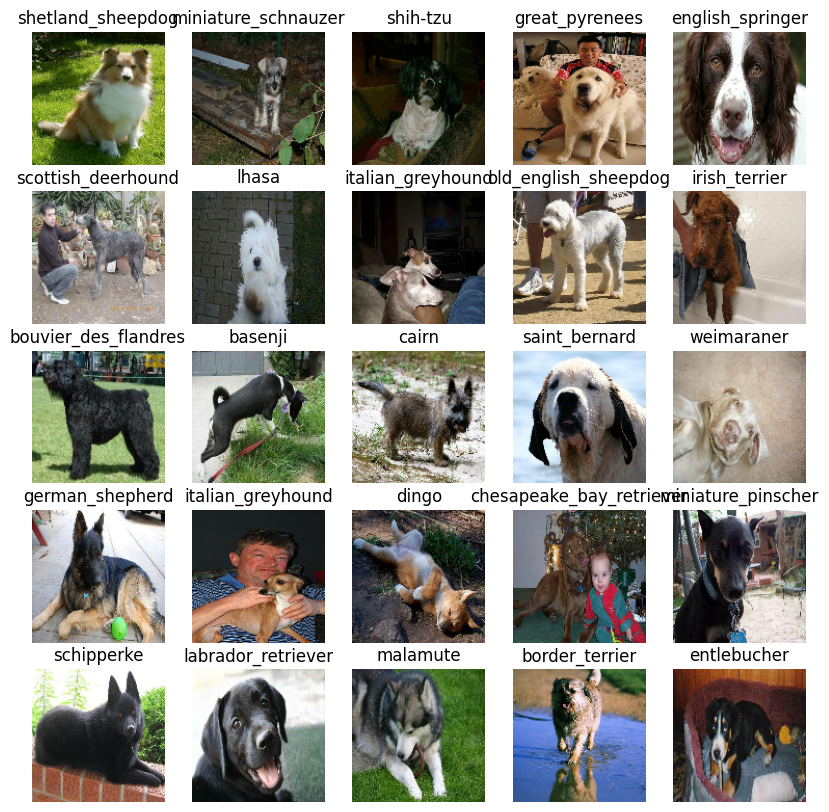

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)
show_25_images(train_images, train_labels)

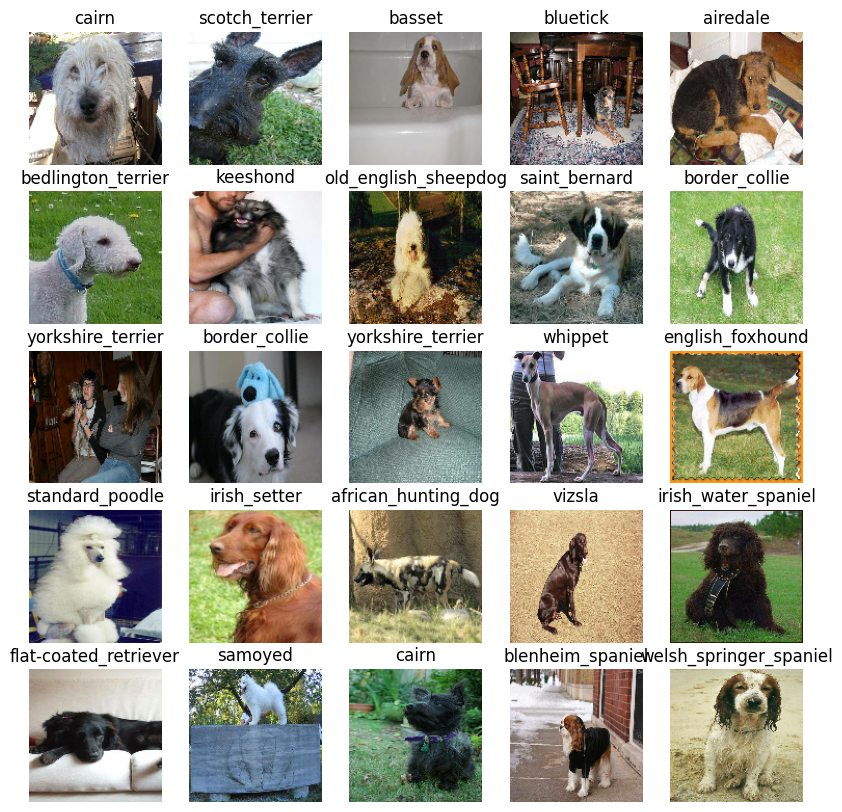

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define
* Input shape(image shape in form of tensors)
* Output shape(image label in form of tensors)
* URL of model we want to use

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"

In [ ]:
def create_model(inputshape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", model_url)
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks
Callbacks are helper functions for models to use during training to do such things as save its progress or stop training early if model stops imporving.

we'll create two callbacks, one for TensorBoard to track our progress and another for early stopping which prevents form training too long

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/dog vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 [==============================] - 296s 12s/step - loss: 5.6521 - accuracy: 0.0388 - val_loss: 4.6741 - val_accuracy: 0.0800
Epoch 2/100
25/25 [==============================] - 11s 426ms/step - loss: 2.3937 - accuracy: 0.4050 - val_loss: 3.7711 - val_accuracy: 0.2000
Epoch 3/100
25/25 [==============================] - 9s 373ms/step - loss: 1.0914 - accuracy: 0.7675 - val_loss: 3.5335 - val_accuracy: 0.2150
Epoch 4/100
25/25 [==============================] - 7s 280ms/step - loss: 0.5208 - accuracy: 0.9475 - val_loss: 3.5017 - val_accuracy: 0.2600
Epoch 5/100
25/25 [==============================] - 14s 548ms/step - loss: 0.2699 - accuracy: 0.9925 - val_loss: 3.5078 - val_accuracy: 0.2350
Epoch 6/100
25/25 [==============================] - 11s 442ms/step - loss: 0.1683 - accuracy: 0.9987 - val_loss: 3.5083 - val_accuracy: 0.2500
Epoch 7/100
25/25 [============

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog\ vision/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Making and evaluating predictions using a trained model

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 345ms/step


array([[1.9443656e-04, 7.5041968e-03, 1.5921796e-04, ..., 1.2839939e-05,
        4.0470257e-02, 1.1643388e-02],
       [2.1654963e-05, 3.4915811e-05, 1.5469083e-01, ..., 6.9702808e-05,
        6.4473478e-03, 1.1082732e-02],
       [4.6222044e-06, 1.5532693e-02, 5.9532336e-05, ..., 6.5920696e-02,
        4.6699663e-04, 5.0024013e-03],
       ...,
       [2.8184906e-05, 4.4556076e-05, 2.9323081e-04, ..., 5.3869277e-05,
        1.3924830e-04, 6.0343128e-03],
       [5.7593180e-04, 1.1312392e-03, 3.5487305e-05, ..., 2.2136024e-04,
        7.9614896e-05, 2.0608895e-03],
       [1.1234978e-06, 8.6059052e-05, 7.5995061e-04, ..., 5.9494934e-05,
        1.1466445e-03, 9.9653880e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.9443656e-04, 7.5041968e-03, 1.5921796e-04, 1.0625839e-02,
       2.9050495e-04, 3.0834035e-05, 5.8687322e-02, 4.0555262e-04,
       6.2427345e-05, 1.9281880e-04, 7.4583585e-03, 1.5331606e-03,
       1.2459799e-05, 7.0235721e-04, 2.5342654e-03, 1.5314807e-04,
       1.4806916e-04, 6.0833071e-04, 2.2827059e-03, 1.5055301e-06,
       6.2618358e-04, 6.6151668e-04, 7.6345030e-05, 5.1264027e-03,
       2.5646090e-05, 4.2875414e-05, 1.8898399e-01, 8.1590289e-05,
       4.9290368e-03, 4.0318524e-03, 1.7537811e-04, 7.0982771e-03,
       1.6151736e-03, 1.1717893e-04, 3.7115926e-03, 4.0904870e-03,
       3.1525324e-05, 7.5175499e-06, 2.4971674e-04, 2.3976421e-04,
       4.6964165e-02, 9.1748389e-06, 2.0365131e-05, 7.5698155e-04,
       4.0626703e-05, 4.4604898e-05, 4.6139110e-05, 6.0074795e-05,
       1.7471795e-03, 3.5523267e-03, 3.8496574e-04, 6.7200934e-05,
       7.6720049e-03, 6.1688275e-05, 1.8496074e-05, 5.5777050e-06,
       1.5600096e-03, 2.6013430e-03, 2.1156927e-03, 3.1749789e

In [ ]:
index = 27
print(predictions[index])
print(f"Max value (probability): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.74123445e-04 1.22179151e-01 4.94979147e-04 1.13162445e-02
 7.67698861e-04 4.35312541e-06 5.45673594e-02 1.28314621e-03
 7.92503397e-06 8.23584487e-05 5.87135837e-05 1.62205961e-05
 1.76340091e-05 1.95011977e-04 5.74124511e-04 6.72630586e-06
 2.88521569e-05 1.94334909e-02 1.75629128e-02 2.19482226e-05
 8.52714409e-04 1.65639125e-04 4.10396751e-04 8.96080397e-03
 6.95236804e-06 1.56125810e-04 2.89377607e-02 1.22399849e-03
 1.05910818e-03 6.62201503e-03 1.04204658e-03 2.69599212e-03
 1.77128983e-04 1.97429312e-04 3.43658816e-04 2.42481983e-05
 1.39168957e-02 7.54105567e-04 6.09416784e-05 2.85942842e-05
 1.05272175e-03 8.01036151e-07 4.47126922e-06 2.64898269e-03
 2.55434152e-05 3.39593482e-03 1.53769535e-04 4.47902392e-04
 6.34913958e-05 3.33739934e-03 2.70237178e-05 4.48533538e-05
 2.21870432e-05 3.40344268e-05 5.61582237e-05 5.93070174e-04
 6.74301817e-04 1.50005415e-01 2.94566591e-04 5.51517755e-02
 5.03630763e-05 2.54643910e-05 8.71159544e-04 1.04048893e-04
 3.73992627e-03 4.758692

In [ ]:
unique_breeds[119]

'yorkshire_terrier'

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[27])
pred_label

'irish_terrier'

In [ ]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.25828475, 0.36198825, 0.24389817],
         [0.39360544, 0.3418826 , 0.30183154],
         [0.8296768 , 0.7504122 , 0.74760556],
         ...,
         [0.8228947 , 0.8611053 , 0.8719636 ],
         [0.76902866, 0.8160875 , 0.8079686 ],
         [0.8183106 , 0.82737565, 0.84341663]],
 
        [[0.30484715, 0.29425842, 0.2039199 ],
         [0.4352226 , 0.37971696, 0.31883615],
         [0.8593526 , 0.80739874, 0.77293175],
         ...,
         [0.85530514, 0.89059925, 0.917223  ],
         [0.80846506, 0.8516023 , 0.8737746 ],
         [0.7754192 , 0.8053707 , 0.84239584]],
 
        [[0.75496686, 0.6921665 , 0.66526437],
         [0.807427  , 0.804948  , 0.7710658 ],
         [0.9814564 , 0.9935267 , 0.971697  ],
         ...,
         [0.91192657, 0.94484705, 0.9793709 ],
         [0.8952671 , 0.9312506 , 0.98800606],
         [0.8093318 , 0.85525966, 0.91700304]],
 
        ...,
 
        [[0.45503026, 0.4585416 , 0.41656855],
         [0.5492001 , 0.5392863 , 0.49725

In [ ]:
get_pred_label(val_labels[0])

'cairn'

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color = "green"
  else:
    color = "red"
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

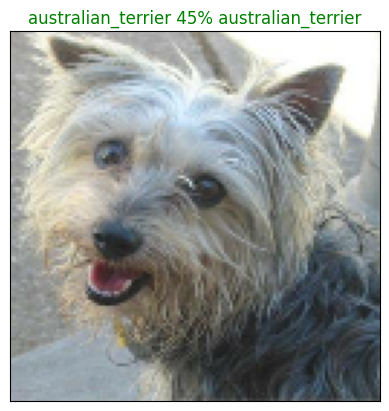

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=98)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label=prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass


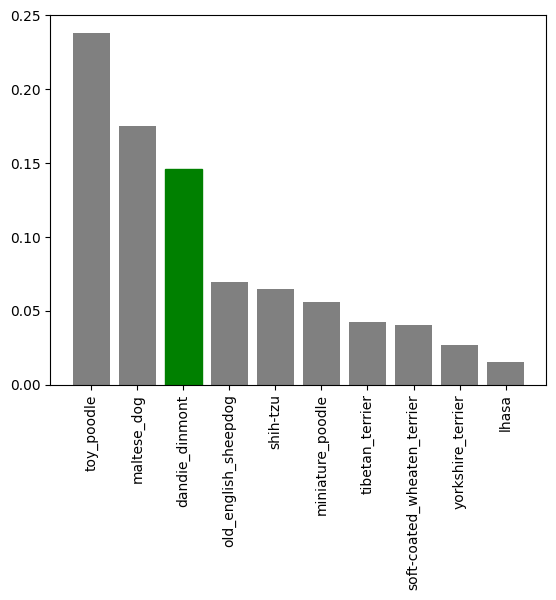

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=30)

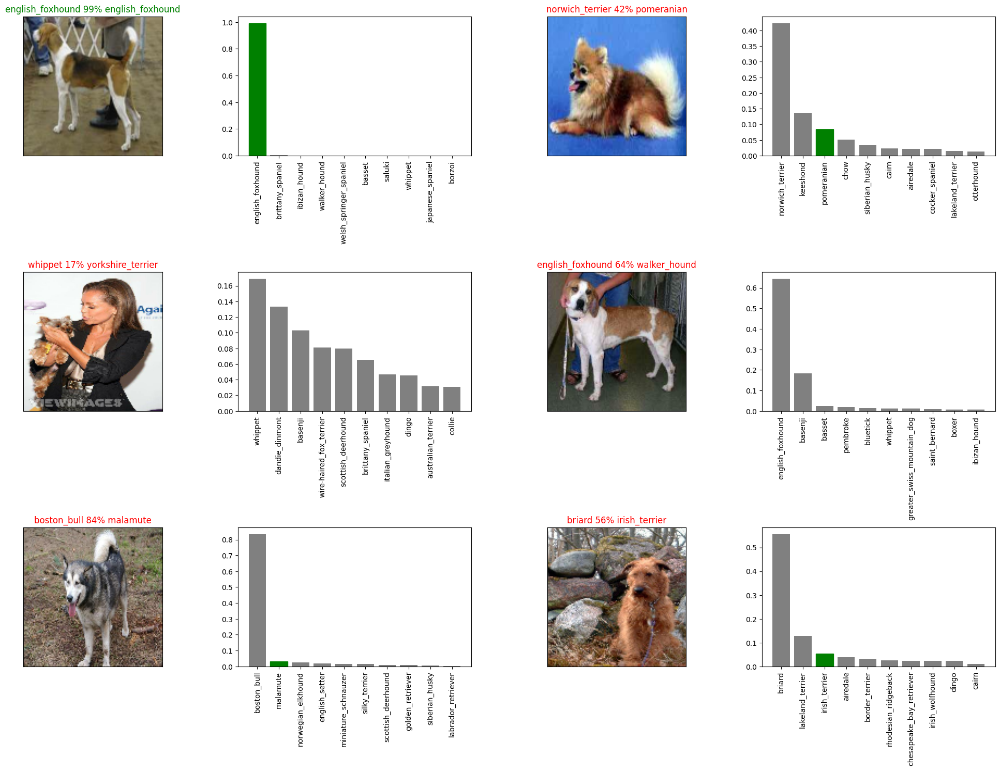

In [ ]:
i_multiplier = 90
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
def save_model(model, suffix=None):
  model_dir = os.path.join("drive/My Drive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" +suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog vision/models/20240723-12581721739518-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/models/20240723-12581721739518-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("drive/My Drive/dog vision/models/20240723-12581721739518-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/dog vision/models/20240723-12581721739518-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 166ms/step - loss: 3.5181 - accuracy: 0.2350


[3.518056631088257, 0.23499999940395355]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 4s 315ms/step - loss: 3.5181 - accuracy: 0.2350


[3.518056631088257, 0.23499999940395355]

## Training a big dog model (on the full data)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 93s 273ms/step - loss: 2.8885 - accuracy: 0.3304
Epoch 2/100
320/320 [==============================] - 81s 252ms/step - loss: 1.6392 - accuracy: 0.5546
Epoch 3/100
320/320 [==============================] - 84s 261ms/step - loss: 1.2838 - accuracy: 0.6302
Epoch 4/100
320/320 [==============================] - 82s 254ms/step - loss: 1.0360 - accuracy: 0.7022
Epoch 5/100
320/320 [==============================] - 86s 266ms/step - loss: 0.8477 - accuracy: 0.7504
Epoch 6/100
320/320 [==============================] - 81s 254ms/step - loss: 0.7124 - accuracy: 0.7909
Epoch 7/100
320/320 [==============================] - 87s 272ms/step - loss: 0.6020 - accuracy: 0.8266
Epoch 8/100
320/320 [==============================] - 85s 266ms/step - loss: 0.5103 - accuracy: 0.8546
Epoch 9/100
320/320 [==============================] - 80s 249ms/step - loss: 0.4232 - accuracy: 0.8868
Epoch 10/100
320/320 [==============================] - 79s 248m

In [ ]:
save_model(full_model, suffix="full_image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog vision/models/20240723-14061721743600-full_image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/models/20240723-14061721743600-full_image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/dog vision/models/20240723-14061721743600-full_image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/dog vision/models/20240723-14061721743600-full_image-set-mobilenetv2-Adam.h5


## Making Predictions on the test data set

In [ ]:
test_path = "drive/MyDrive/dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 'drive/MyDrive/dog vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/dog vision/test/e2f853c8345758faf5d9b2075f196fd3.jpg',
 'drive/MyDrive/dog vision/test/e01b6b1e7cef1d9abdfbeb4afb88379f.jpg',
 'drive/MyDrive/dog vision/test/e757a7450559dc61a9261fe978e23b04.jpg',
 'drive/MyDrive/dog vision/test/ddd7f84a932ec7213b9c1f6de8c09262.jpg',
 'drive/MyDrive/dog vision/test/dcab2d03a686ab3f31d1bc3e5700f6d1.jpg',
 'drive/MyDrive/dog vision/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 'drive/MyDrive/dog vision/test/e090f0f0ebc83ddf5f649a841493868b.jpg',
 'drive/MyDrive/dog vision/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 1455s 4s/step


In [ ]:
np.savetxt("drive/My Drive/dog vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/My Drive/dog vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.73799225e-10, 2.70915052e-07, 8.77538753e-07, ...,
        6.07001493e-06, 7.70458187e-13, 6.54538290e-09],
       [1.63642630e-18, 4.17538920e-15, 1.05726692e-16, ...,
        1.41831796e-10, 1.12401971e-12, 4.97548583e-16],
       [8.53542126e-09, 5.02053021e-09, 9.46030906e-13, ...,
        1.73384935e-11, 3.52088250e-16, 2.95164934e-12],
       ...,
       [1.12926536e-07, 2.30945374e-09, 1.56258704e-11, ...,
        5.43470705e-13, 9.99239447e-09, 5.03764738e-07],
       [2.16284138e-06, 3.44064190e-08, 2.10281303e-08, ...,
        4.45807309e-05, 3.83629766e-03, 6.65809141e-09],
       [4.55709414e-05, 1.00974717e-06, 1.10883214e-09, ...,
        1.50351909e-08, 3.62439869e-06, 2.31383410e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for kaggle
https://www.kaggle.com/c/dog-breed-identification/overview

In [ ]:
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids


In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e421e13d0d4c977ab89fa9965221809c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e193c532dc7c9a5ee397848a1ee007f0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2f853c8345758faf5d9b2075f196fd3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e01b6b1e7cef1d9abdfbeb4afb88379f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e757a7450559dc61a9261fe978e23b04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e421e13d0d4c977ab89fa9965221809c,1.737992e-10,2.709151e-07,8.775388e-07,1.863289e-06,1.913429e-07,1.150395e-12,1.416738e-06,1.406043e-05,2.656844e-07,...,6.440181e-06,6.931863e-10,1.533096e-04,5.880326e-10,2.916917e-08,5.162460e-09,7.199931e-10,6.070015e-06,7.704582e-13,6.545383e-09
1,e193c532dc7c9a5ee397848a1ee007f0,1.636426e-18,4.175389e-15,1.057267e-16,1.074058e-20,9.696539e-08,3.506917e-10,1.322861e-13,4.912147e-20,1.562026e-13,...,1.764835e-18,1.822741e-10,1.062777e-18,6.846766e-13,1.226417e-10,2.105655e-06,7.223979e-12,1.418318e-10,1.124020e-12,4.975486e-16
2,e2f853c8345758faf5d9b2075f196fd3,8.535421e-09,5.020530e-09,9.460309e-13,1.423973e-14,1.632164e-07,7.435687e-09,6.222297e-16,1.327813e-17,2.502460e-07,...,6.241077e-16,1.735324e-12,9.359744e-10,8.768146e-10,1.300168e-09,4.478967e-12,8.459830e-16,1.733849e-11,3.520882e-16,2.951649e-12
3,e01b6b1e7cef1d9abdfbeb4afb88379f,5.750163e-11,4.187963e-09,9.355857e-15,7.559731e-07,4.708124e-13,8.790992e-15,8.854598e-01,7.010451e-14,3.202747e-13,...,9.332605e-10,6.323624e-11,2.005859e-11,1.653231e-19,1.351974e-15,6.797242e-13,7.065324e-15,1.787588e-13,2.782293e-09,9.629524e-06
4,e757a7450559dc61a9261fe978e23b04,3.516044e-15,1.729316e-12,7.625701e-06,2.604872e-10,6.455313e-05,9.883859e-09,2.377217e-09,3.602987e-07,9.910599e-11,...,7.734154e-10,4.658482e-05,4.063341e-10,3.454256e-12,3.940725e-09,3.678142e-10,9.998192e-13,5.784061e-05,6.914791e-12,2.120285e-13


In [ ]:
preds_df.to_csv("drive/My Drive/dog vision/full_model_predictions_submission_1.csv",
                index=False)

## Custom Data

In [ ]:
custom_path = "drive/My Drive/dog vision/honey/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/My Drive/dog vision/honey/WhatsApp Image 2024-07-23 at 22.17.00_df6cb555.jpg',
 'drive/My Drive/dog vision/honey/WhatsApp Image 2024-07-23 at 22.17.00_573d5d0f.jpg',
 'drive/My Drive/dog vision/honey/.ipynb_checkpoints']

In [ ]:
custom_data = create_data_batches(custom_image_paths[0:2], test_data=True)

Creating test data batches...


In [ ]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data, verbose=1)

1/1 [==============================] - 0s 89ms/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['shih-tzu', 'shih-tzu']

In [ ]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

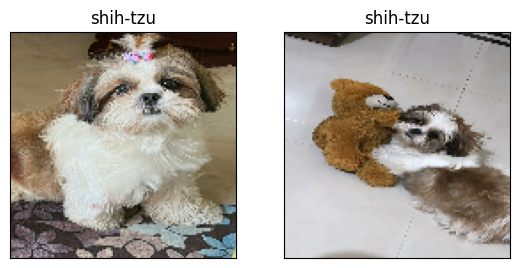

In [ ]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(3, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)